In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/diabetes/diabetes.csv


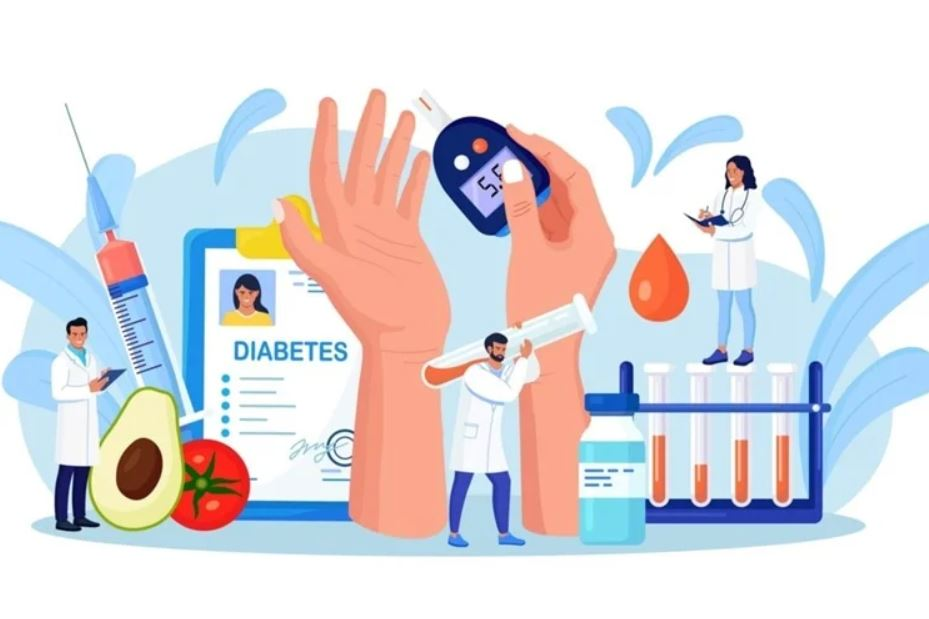

# About Dataset

This dataset is a part of a large dataset held at the National Institute of Diabetes and Digestive and Kidney Diseases, and is used for a diabetes study conducted on Pima  Indian women aged 21 and above living in Phoenix, the fifth-largest city in the state of Arizona in the United States.  

The target variable is specified as "outcome", where 1 indicates a positive result of the diabetes test and 0 indicates a negative result.

A machine learning model is requested to be developed that can predict whether individuals have diabetes or not when their features are given. Before developing the model, performing the necessary data analysis and feature engineering steps are expected.

**There are 9 variables in the dataset:**  

Pregnancies: Number of pregnancies.  
Glucose: 2-hour plasma glucose concentration during an oral glucose tolerance test.  
Blood Pressure: Blood Pressure (Diastolic) (mm Hg).  
SkinThickness : Thickness of skin  
Insulin: 2-Hour Serum Insulin (mu U/ml)  
DiabetesPedigreeFunction: Function (2-hour plasma glucose concentration during an oral glucose tolerance test).  
BMI: Body Mass Index (weight in kg/(height in meters)^2)  
Age: Persons age(in years)  
Outcome: Having diabetes status (1: diabetes, 0: no diabetes)


# Load Dataset

In [2]:
# Import the libraries :

import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
!pip install missingno
import missingno as msno
from datetime import date
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
from sklearn.neighbors import LocalOutlierFactor
from sklearn.preprocessing import MinMaxScaler, LabelEncoder, StandardScaler, RobustScaler
from pandas_profiling import ProfileReport

In [3]:
#Some configurations

pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', lambda x: '%.3f' % x)
pd.set_option('display.width', 500)

In [4]:
#Load the dataset :

df= pd.read_csv('/kaggle/input/diabetes/diabetes.csv')

# Exploratory Data Analysis

In exploratory data analysis, the type of the variables (e.g. integer or decimal) is first printed, the sum of the missing values (either null or na) is calculated, and it is found that no such value exists.  
In addition, some statistical measures are calculated to understand their variation. Some of these statistical measures are the mean of each column, the median, the standard deviation, the percentages, etc.

In [5]:
df.shape

(768, 9)

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [7]:
#Is there any missing value in the dataset?
df.isnull().any()

Pregnancies                 False
Glucose                     False
BloodPressure               False
SkinThickness               False
Insulin                     False
BMI                         False
DiabetesPedigreeFunction    False
Age                         False
Outcome                     False
dtype: bool

In [8]:
# Concise statistical description of numeric features
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.000,3.845,3.370,0.000,1.000,3.000,6.000,17.000
Glucose,768.000,120.895,31.973,0.000,99.000,117.000,140.250,199.000
BloodPressure,768.000,69.105,19.356,0.000,62.000,72.000,80.000,122.000
SkinThickness,768.000,20.536,15.952,0.000,0.000,23.000,32.000,99.000
Insulin,768.000,79.799,115.244,0.000,0.000,30.500,127.250,846.000
BMI,768.000,31.993,7.884,0.000,27.300,32.000,36.600,67.100
DiabetesPedigreeFunction,768.000,0.472,0.331,0.078,0.244,0.372,0.626,2.420
Age,768.000,33.241,11.760,21.000,24.000,29.000,41.000,81.000
Outcome,768.000,0.349,0.477,0.000,0.000,0.000,1.000,1.000


In [9]:
#Are there any duplicate values?
df.duplicated().any()

False

In [10]:
#We can access information and analysis about the dataset using ProfileReport.

profile = ProfileReport(df, title="Diabetes Classification")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Now let's apply the function that will separate the numerical and categorical variables for us:


In [11]:
def grab_col_names (dataframe, cat_trh=10, car_thr=20):
    cat_cols= [col for  col in dataframe.columns if dataframe[col].dtype =='O']
    num_but_cat=[col for col in dataframe.columns if dataframe[col].nunique() < cat_trh and dataframe[col].dtype != 'O']
    cat_but_car = [col for col in dataframe.columns if dataframe[col].nunique() > car_thr and dataframe[col].dtypes == "O"]
    cat_cols = cat_cols + num_but_cat
    cat_cols = [col for col in cat_cols if col not in cat_but_car]

    num_cols= [col for col in  dataframe.columns if dataframe[col].dtype != 'O']
    num_cols = [col for col in num_cols if col not in num_but_cat]

    return cat_cols, num_cols, cat_but_car

cat_cols, num_cols, cat_but_car = grab_col_names(df)

# Categorical Variable Analysis

In [12]:
def cat_summary( dataframe, col_name, plot = False):
    print(pd.DataFrame({col_name: dataframe[col_name].value_counts(),
                       'Ratio':100 * dataframe[col_name].value_counts()/len(dataframe)}))
    print('#####################',col_name,'############################')

    if plot:
        sns.countplot(x = dataframe[col_name], data = dataframe, edgecolor='black', color='#D6B2B1')
        plt.show(block = True)

   Outcome  Ratio
0      500 65.104
1      268 34.896
##################### Outcome ############################


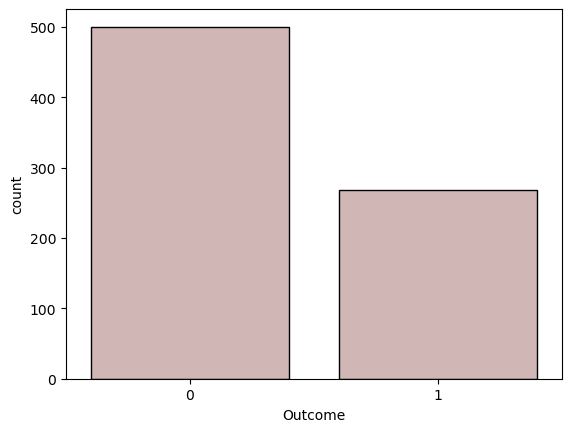

In [13]:
for col in cat_cols:
    cat_summary(df, col, plot = True)

    Pregnancies  Ratio
1           135 17.578
0           111 14.453
2           103 13.411
3            75  9.766
4            68  8.854
5            57  7.422
6            50  6.510
7            45  5.859
8            38  4.948
9            28  3.646
10           24  3.125
11           11  1.432
13           10  1.302
12            9  1.172
14            2  0.260
15            1  0.130
17            1  0.130
##################### Pregnancies ############################


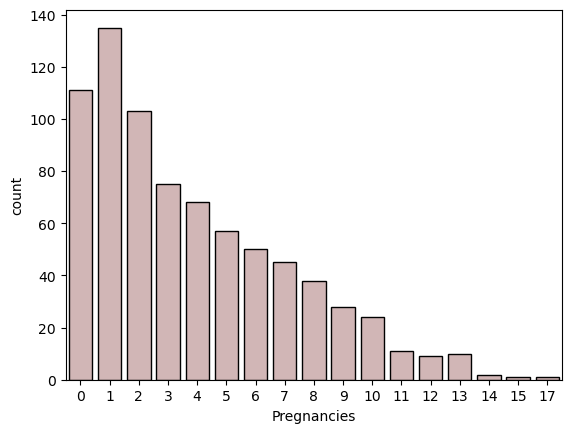

     Glucose  Ratio
99        17  2.214
100       17  2.214
111       14  1.823
129       14  1.823
125       14  1.823
..       ...    ...
191        1  0.130
177        1  0.130
44         1  0.130
62         1  0.130
190        1  0.130

[136 rows x 2 columns]
##################### Glucose ############################


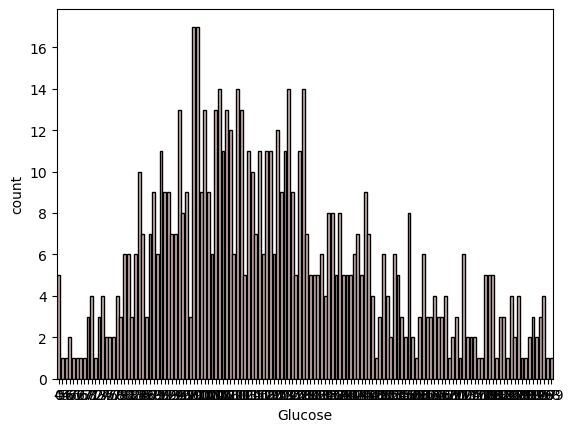

     BloodPressure  Ratio
70              57  7.422
74              52  6.771
78              45  5.859
68              45  5.859
72              44  5.729
64              43  5.599
80              40  5.208
76              39  5.078
60              37  4.818
0               35  4.557
62              34  4.427
66              30  3.906
82              30  3.906
88              25  3.255
84              23  2.995
90              22  2.865
86              21  2.734
58              21  2.734
50              13  1.693
56              12  1.562
52              11  1.432
54              11  1.432
75               8  1.042
92               8  1.042
65               7  0.911
85               6  0.781
94               6  0.781
48               5  0.651
96               4  0.521
44               4  0.521
100              3  0.391
106              3  0.391
98               3  0.391
110              3  0.391
55               2  0.260
108              2  0.260
104              2  0.260
46          

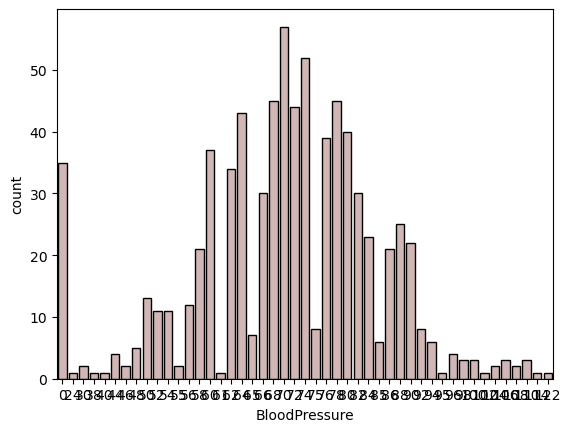

    SkinThickness  Ratio
0             227 29.557
32             31  4.036
30             27  3.516
27             23  2.995
23             22  2.865
33             20  2.604
28             20  2.604
18             20  2.604
31             19  2.474
19             18  2.344
39             18  2.344
29             17  2.214
40             16  2.083
25             16  2.083
26             16  2.083
22             16  2.083
37             16  2.083
41             15  1.953
35             15  1.953
36             14  1.823
15             14  1.823
17             14  1.823
20             13  1.693
24             12  1.562
42             11  1.432
13             11  1.432
21             10  1.302
46              8  1.042
34              8  1.042
12              7  0.911
38              7  0.911
11              6  0.781
43              6  0.781
16              6  0.781
45              6  0.781
14              6  0.781
44              5  0.651
10              5  0.651
48              4  0.521


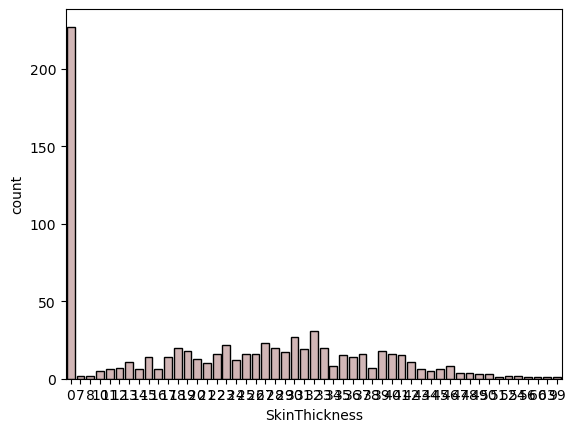

     Insulin  Ratio
0        374 48.698
105       11  1.432
130        9  1.172
140        9  1.172
120        8  1.042
..       ...    ...
73         1  0.130
171        1  0.130
255        1  0.130
52         1  0.130
112        1  0.130

[186 rows x 2 columns]
##################### Insulin ############################


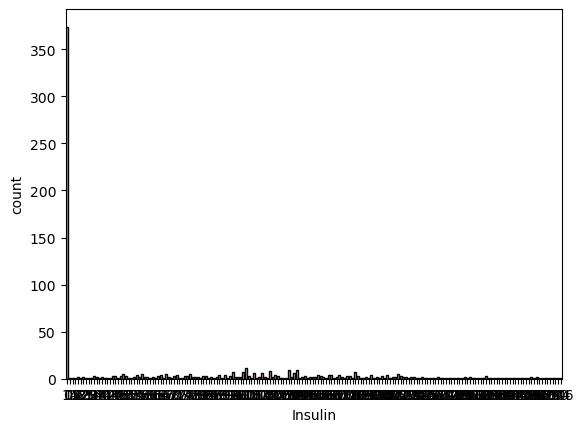

        BMI  Ratio
32.000   13  1.693
31.600   12  1.562
31.200   12  1.562
0.000    11  1.432
32.400   10  1.302
...     ...    ...
36.700    1  0.130
41.800    1  0.130
42.600    1  0.130
42.800    1  0.130
46.300    1  0.130

[248 rows x 2 columns]
##################### BMI ############################


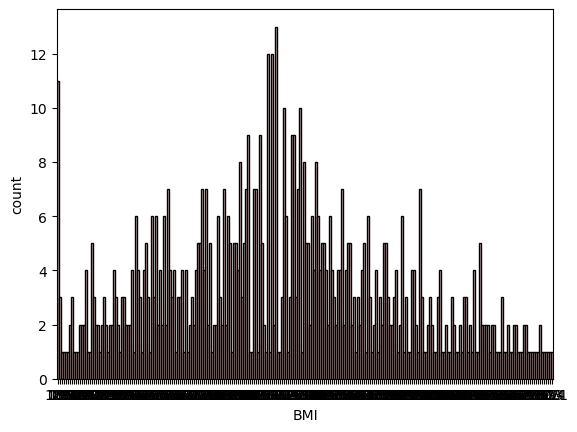

       DiabetesPedigreeFunction  Ratio
0.258                         6  0.781
0.254                         6  0.781
0.268                         5  0.651
0.207                         5  0.651
0.261                         5  0.651
...                         ...    ...
1.353                         1  0.130
0.655                         1  0.130
0.092                         1  0.130
0.926                         1  0.130
0.171                         1  0.130

[517 rows x 2 columns]
##################### DiabetesPedigreeFunction ############################


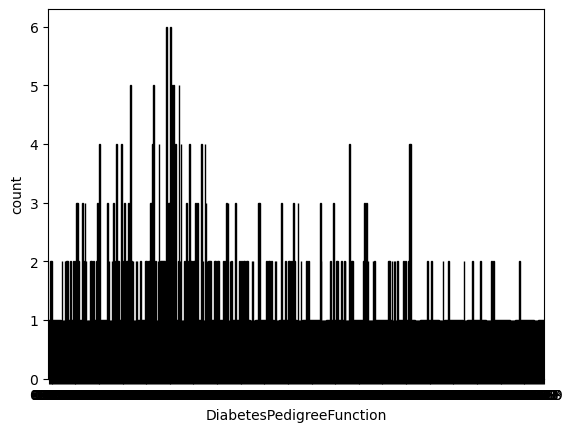

    Age  Ratio
22   72  9.375
21   63  8.203
25   48  6.250
24   46  5.990
23   38  4.948
28   35  4.557
26   33  4.297
27   32  4.167
29   29  3.776
31   24  3.125
41   22  2.865
30   21  2.734
37   19  2.474
42   18  2.344
33   17  2.214
38   16  2.083
36   16  2.083
32   16  2.083
45   15  1.953
34   14  1.823
46   13  1.693
43   13  1.693
40   13  1.693
39   12  1.562
35   10  1.302
50    8  1.042
51    8  1.042
52    8  1.042
44    8  1.042
58    7  0.911
47    6  0.781
54    6  0.781
49    5  0.651
48    5  0.651
57    5  0.651
53    5  0.651
60    5  0.651
66    4  0.521
63    4  0.521
62    4  0.521
55    4  0.521
67    3  0.391
56    3  0.391
59    3  0.391
65    3  0.391
69    2  0.260
61    2  0.260
72    1  0.130
81    1  0.130
64    1  0.130
70    1  0.130
68    1  0.130
##################### Age ############################


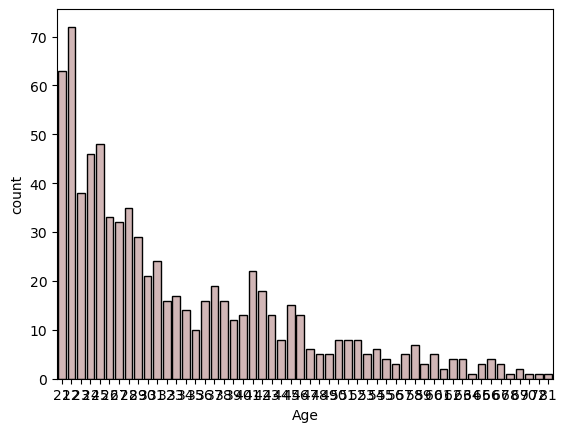

In [14]:
for col in num_cols:
    cat_summary(df, col, plot = True)

# Target Veriable Analysis

We can see the distribution of all variables over the target variable ;

Column names except for the target column are : ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin', 'BMI', 'DiabetesPedigreeFunction', 'Age']

Colors for the graphs are : ['b', 'c', 'g', 'k', 'm', 'r', 'y', 'b']


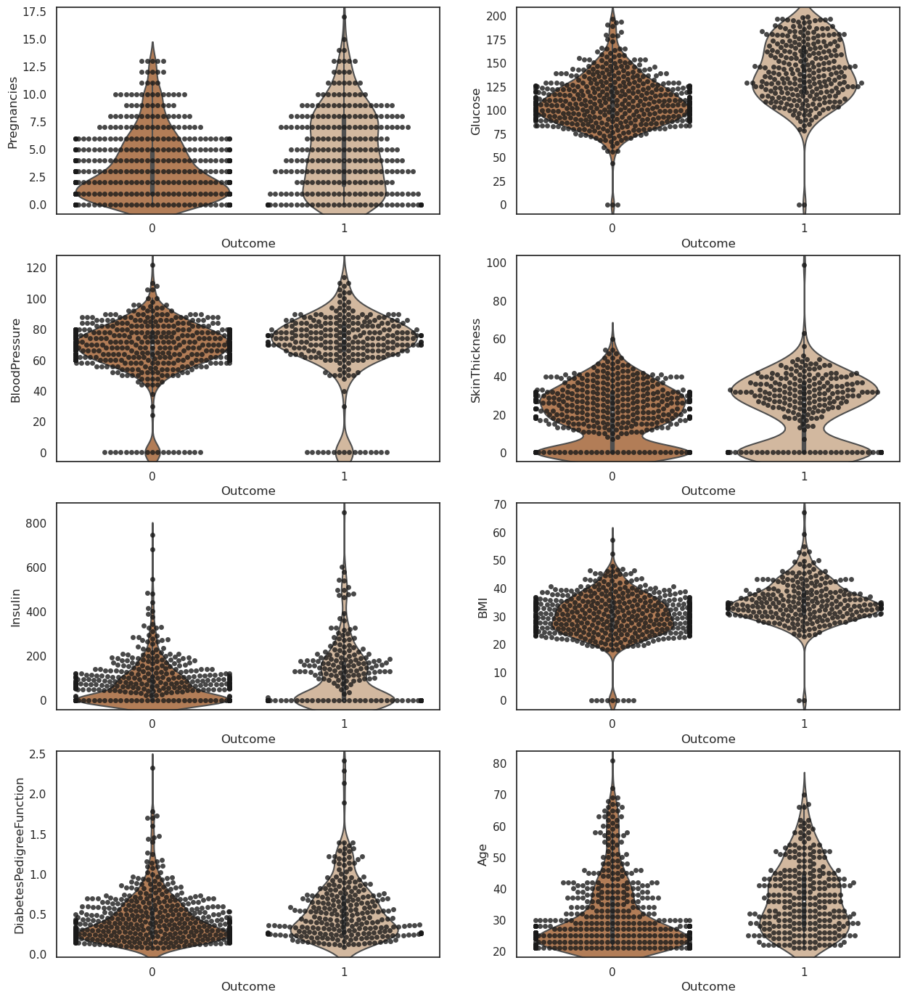

In [15]:
import warnings
warnings.filterwarnings("ignore")

columns = df.columns
columns = list(columns)
columns.pop()
print("Column names except for the target column are :", columns)

# Graphs to be plotted with these colors
colours = ['b', 'c', 'g', 'k', 'm', 'r', 'y', 'b']
print()
print('Colors for the graphs are :', colours)
sns.set(rc={'figure.figsize': (15, 17)})
colors_list = ['#c17a48', '#dab897']
j = 1
sns.set_style(style='white')

for i in (columns):
    plt.subplot(4, 2, j)
    sns.violinplot(x="Outcome", y=i, data=df, kind="violin", split=True, height=4, aspect=.7, palette=colors_list)
    sns.swarmplot(x='Outcome', y=i, data=df, color="k", alpha=0.8)
    j = j + 1
plt.show(block=True)

In [16]:
# Let's look at the means of the numerical variables according to the target variable.

for col in num_cols:
    print(df.groupby('Outcome').agg({col: 'mean'}))


         Pregnancies
Outcome             
0              3.298
1              4.866
         Glucose
Outcome         
0        109.980
1        141.257
         BloodPressure
Outcome               
0               68.184
1               70.825
         SkinThickness
Outcome               
0               19.664
1               22.164
         Insulin
Outcome         
0         68.792
1        100.336
           BMI
Outcome       
0       30.304
1       35.143
         DiabetesPedigreeFunction
Outcome                          
0                           0.430
1                           0.550
           Age
Outcome       
0       31.190
1       37.067


# Outlier Analysis

In [17]:
#Let's determine the necessary lower and upper limits to conduct outlier analysis

def outlier_thresholds(dataframe, col_name, q1=0.10, q3=0.90):
    quartile1 = dataframe[col_name].quantile(q1)
    quartile3 = dataframe[col_name].quantile(q3)
    interquantile_range = quartile3 - quartile1
    up_limit = quartile3 + 1.5 * interquantile_range
    low_limit = quartile1 - 1.5 * interquantile_range
    return low_limit, up_limit


In [18]:
#Let's write a function that returns True if there is a value outside of the lower and upper limits that we have set for the function's variables.

def check_outlier(dataframe, col_name):
    low_limit, up_limit = outlier_thresholds(dataframe, col_name)
    if dataframe[(dataframe[col_name] > up_limit) | (dataframe[col_name] < low_limit)].any(axis=None):
        return True
    else:
        return False

In [19]:
check_outlier(df, cat_cols)

False

In [20]:
check_outlier(df, num_cols)

True

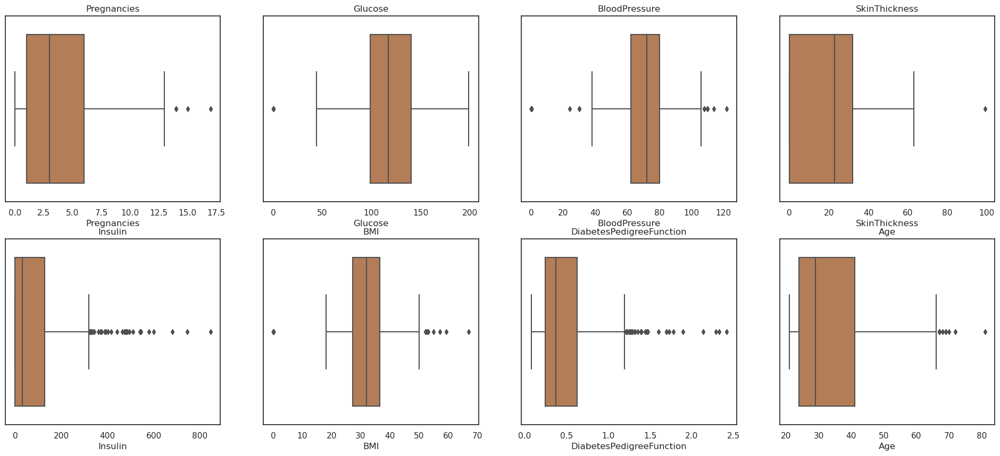

In [21]:
#We can see the outliers on boxplot:

fig, axes = plt.subplots(2, 4, figsize=(24, 10))
for i, col in enumerate(num_cols):
    sns.boxplot(x=df[col], ax=axes[i//4, i%4], color='#c17a48')
    axes[i//4, i%4].set_title(col)
plt.show(block=True)


In [22]:
#Let's suppress the outliers according to the lower and upper limits we have created.

def replace_with_thresholds(dataframe, variable):
    low_limit, up_limit = outlier_thresholds(dataframe, variable)
    dataframe.loc[(dataframe[variable] < low_limit), variable] = low_limit
    dataframe.loc[(dataframe[variable] > up_limit), variable] = up_limit

In [23]:
for col in df[num_cols]:
    replace_with_thresholds(df, col)

In [24]:
#When we check again, we will see that there are no outliers:

check_outlier(df, num_cols)

False

There may also be values that are not outliers on their own but may become outliers when evaluated together.   
For example, being 20 years old is not an outlier value, but being pregnant for the 12th time at the age of 20 is a significant event that may be considered an outlier.   
That is why we should also evaluate such situations with Local Outlier Factor:

LOF calculates a local density value for each data point. This value is determined based on the density of the data point's neighbors. The density of a point is determined based on the densities of its surrounding neighbor points.  
Then, LOF compares each point's local density value with the densities of its neighboring points. Outliers are defined as points with much lower density than their surrounding points.   
LOF is an effective outlier detection method, especially for complex and high-dimensional datasets.


In [25]:
clf= LocalOutlierFactor(n_neighbors=20)
clf.fit_predict(df)
df_scores= clf.negative_outlier_factor_ 
#scores are ready.

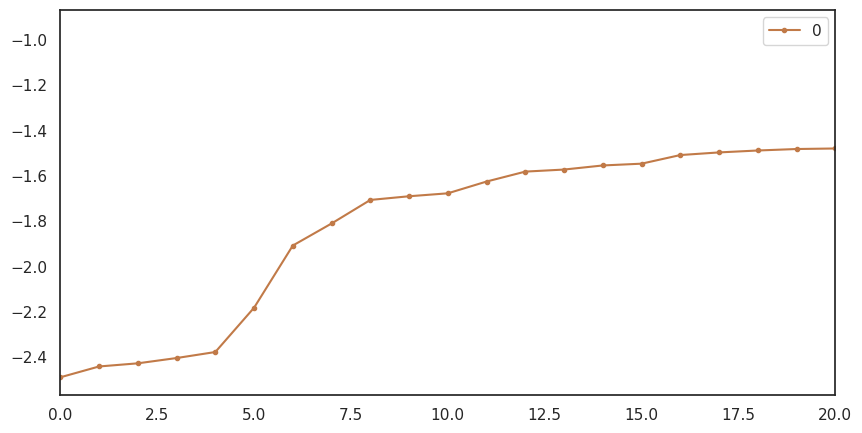

In [26]:
fig, ax = plt.subplots(figsize=(10,5))
scores= pd.DataFrame(np.sort(df_scores))
scores.plot(stacked=True, xlim=[0,20], style='.-', ax=ax, color='#c17a48' )
plt.show(block=True)

In [27]:
#As seen in the graph, the first and largest break occurs up to the 4th value. We will select this value as the threshold point.

th= np.sort(df_scores)[4]

In [28]:
#And here is the outliers: (Multiple)

df[df_scores < th]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
75,1.000,0,48,20,0,24.700,0.140,22.000,0
342,1.000,0,68,35,0,32.000,0.389,22.000,0
349,5.000,0,80,32,0,41.000,0.346,37.000,1
502,6.000,0,68,41,0,39.000,0.727,41.000,1


In [29]:
#Since there are not too many outliers, we will delete them:

df.shape
df = df[~(df_scores < th)]

# Correlation Matrix For Numeric Features

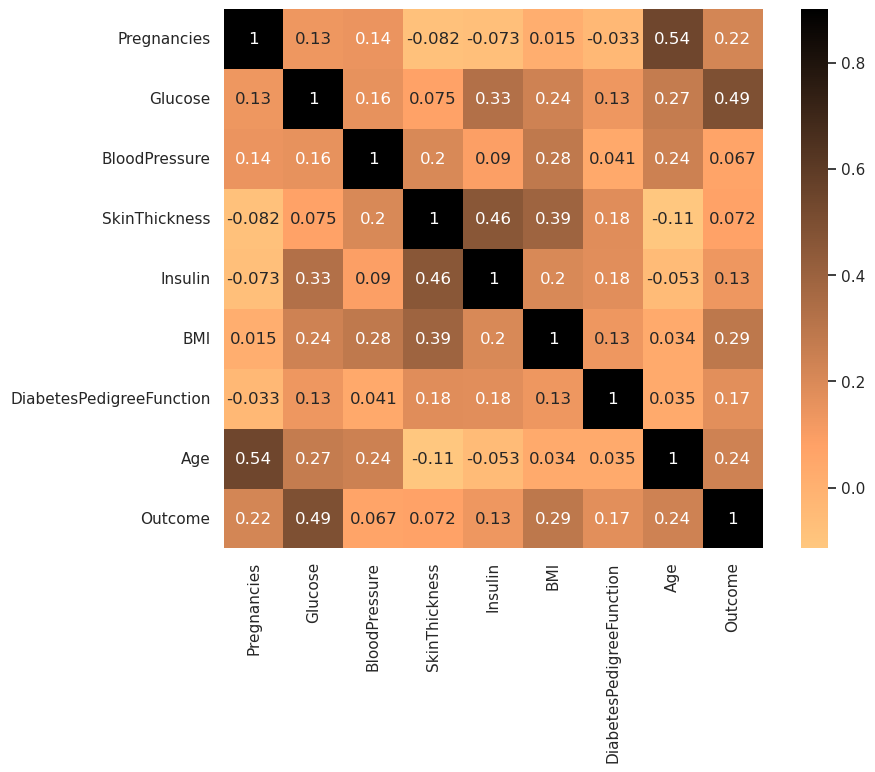

In [30]:
plt.subplots(figsize=(10,7))
sns.heatmap(df.corr(), vmax=0.9, annot=True, square=True,  cmap='copper_r')
plt.show(block=True)

When we examine the graph, we observe that the highest correlation is between the variables of pregnancy-age , glucose-outcome, BMI-skin thickness and insulin-skin thickness.

# Missing Values (KNN Imputer)

In [31]:
df.isnull().any()


Pregnancies                 False
Glucose                     False
BloodPressure               False
SkinThickness               False
Insulin                     False
BMI                         False
DiabetesPedigreeFunction    False
Age                         False
Outcome                     False
dtype: bool

We had analyzed that there were no missing values in the dataset. However, we can observe that there are meaningless values in the dataset.     
For example: Variables such as Glucose, Insulin, Skin Thickness and Blood Pressure cannot be 0.   
Therefore, we might need to count them as NAN. Let's check descripteves of the variables again.

In [32]:
df.loc[ df['Insulin'] == 0, 'Insulin'] = np.nan
df.loc[ df['SkinThickness'] == 0, 'SkinThickness'] = np.nan
df.loc[ df['Glucose'] == 0, 'Glucose'] = np.nan
df.loc[ df['BMI'] == 0, 'BMI'] = np.nan

Now let's fill in these missing values by estimating them based on similar values with k-NN.  
**KNN Imputer** is an imputation method used to replace missing data.  
This method attempts to predict missing data by using K neighbors around similar features. This process is done similar to the K-Nearest Neighbor algorithm.  
KNN Imputer predicts each missing value in the dataset using the KNN algorithm and then completes the missing values with the predicted values.

In [33]:
#Categorical variables were expressed as numeric variables:
dff= pd.get_dummies(df, drop_first=True)  

In [34]:
#Standardization of variables.
scaler= MinMaxScaler()
dff= pd.DataFrame(scaler.fit_transform(dff), columns=dff.columns)

In [35]:
#Filling in missing values  with KNN.
from sklearn.impute import KNNImputer
imputer= KNNImputer(n_neighbors=5)
dff= pd.DataFrame(imputer.fit_transform(dff), columns=dff.columns)
dff.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,0.353,0.671,0.580,0.304,0.597,0.315,0.293,0.483,1.000
1,0.059,0.265,0.529,0.239,0.096,0.172,0.146,0.167,0.000
2,0.471,0.897,0.513,0.274,0.438,0.104,0.317,0.183,1.000
3,0.059,0.290,0.529,0.174,0.157,0.202,0.048,0.000,0.000
4,0.000,0.600,0.311,0.304,0.301,0.509,1.000,0.200,1.000


In [36]:
dff= pd.DataFrame(scaler.inverse_transform(dff), columns=dff.columns) 
#We made the data readable by reversing the standardization.
dff.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6.000,148.000,72.000,35.000,319.200,33.600,0.627,50.000,1.000
1,1.000,85.000,66.000,29.000,63.000,26.600,0.351,31.000,0.000
2,8.000,183.000,64.000,32.200,238.000,23.300,0.672,32.000,1.000
3,1.000,89.000,66.000,23.000,94.000,28.100,0.167,21.000,0.000
4,0.000,137.000,40.000,35.000,168.000,43.100,1.949,33.000,1.000


In [37]:
#Let's observe the missing values and the new filled values in Insulin veriable:

df['Insulin_Imputed_KNN'] = dff[['Insulin']]
df.loc[df['Insulin'].isnull()]

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,Insulin_Imputed_KNN
0,6.000,148.000,72,35.000,NaN,33.600,0.627,50.000,1,319.200
1,1.000,85.000,66,29.000,NaN,26.600,0.351,31.000,0,63.000
2,8.000,183.000,64,NaN,NaN,23.300,0.672,32.000,1,238.000
5,5.000,116.000,74,NaN,NaN,25.600,0.201,30.000,0,121.800
7,10.000,115.000,3,NaN,NaN,35.300,0.134,29.000,0,166.600
...,...,...,...,...,...,...,...,...,...,...
761,9.000,170.000,74,31.000,NaN,44.000,0.403,43.000,1,112.000
762,9.000,89.000,62,NaN,NaN,22.500,0.142,33.000,0,122.400
764,2.000,122.000,70,27.000,NaN,36.800,0.340,27.000,0,NaN
766,1.000,126.000,60,NaN,NaN,30.100,0.349,47.000,1,NaN


In [38]:
df = dff

# Generating New Features

When we examine the corr graph, we observe that the highest correlation is between the variables of pregnancy-age , glucose-outcome and insulin-skin thickness.  
We can generate new variables that we believe have a contribution to the target variable.

In [39]:
df['Pregnancies'].value_counts()
df.loc[ (df['Pregnancies'] == 0 ) , 'PREGNANT_COUNT_NEW' ] = 'no_pregnant'
df.loc[ (df['Pregnancies'] == 1 ) , 'PREGNANT_COUNT_NEW' ] = 'first_pregnant'
df.loc[ ((df['Pregnancies'] > 1 ) & (dff['Pregnancies'] < 10 )), 'PREGNANT_COUNT_NEW' ] = '1_10_pregnant'
df.loc[ (df['Pregnancies'] >= 10 ), 'PREGNANT_COUNT_NEW' ] = '10_more_pregnant'

df['AGE_PREGNACIES_NEW'] = df['Pregnancies']*df['Age']
df['AGE_PREGNACIES_NEW'].describe()
df['AGE_PREGNACIES_NEW_CAT']= pd.cut(df['AGE_PREGNACIES_NEW'], bins = [-1, 26, 83,249, 801], labels=['A', 'B', 'C', 'D'])

In [40]:
df["AGE*DIABETESPEDIGREE_NEW"] = df["Age"] * df["DiabetesPedigreeFunction"]

df['AGE_CAT_NEW']= pd.cut(df['Age'], bins = [20, 30 ,40, 81], labels=['young', 'middle', 'senior'])

In [41]:
df["AGE*BMI_NEW"] = df["Age"] * df["BMI"]

df.loc[(df["BMI"] < 18.5) & ((df["Age"] >= 21) & (df["Age"] < 50)), "AGE_BMI_NOM_NEW"] = "underweightmature"
df.loc[(df["BMI"] < 18.5) & (df["Age"] >= 50), "AGE_BMI_NOM_NEW"] = "underweightsenior"
df.loc[((df["BMI"] >= 18.5) & (df["BMI"] < 25)) & ((df["Age"] >= 21) & (df["Age"] < 50)), "AGE_BMI_NOM_NEW"] = "healthymature"
df.loc[((df["BMI"] >= 18.5) & (df["BMI"] < 25)) & (df["Age"] >= 50), "AGE_BMI_NOM_NEW"] = "healthysenior"
df.loc[((df["BMI"] >= 25) & (df["BMI"] < 30)) & ((df["Age"] >= 21) & (df["Age"] < 50)), "AGE_BMI_NOM_NEW"] = "overweightmature"
df.loc[((df["BMI"] >= 25) & (df["BMI"] < 30)) & (df["Age"] >= 50), "AGE_BMI_NOM_NEW"] = "overweightsenior"
df.loc[(df["BMI"] > 18.5) & ((df["Age"] >= 21) & (df["Age"] < 50)), "AGE_BMI_NOM_NEW"] = "obesemature"
df.loc[(df["BMI"] > 18.5) & (df["Age"] >= 50), "AGE_BMI_NOM_NEW"] = "obesesenior"

In [42]:
df['GLUCOSE_CUT_NEW']= pd.cut(df['Glucose'], bins = [40, 140, 200], labels=['low_glucose', 'high_glukose'])
df["BMI*GLUCOSE_NEW"] = df["Glucose"] * df["BMI"]

In [43]:
df["SKIN*INSULIN_NEW"] = df["SkinThickness"] * df["Insulin"]
df['SKIN*INSULIN_CUT_NEW']= pd.cut(df['SKIN*INSULIN_NEW'], bins = [190, 4000, 42000], labels=['level_a', 'level_b'])

In [44]:
df['SKIN_THICK_NEW']= pd.cut(df['SkinThickness'], bins = [7, 30, 99], labels=['low_skin_thickness', 'high_skin_thickness'])

In [45]:
df['BMI_CUT_NEW']= pd.cut(df['BMI'], bins = [15, 25, 30, 35, 40, 70], labels=['normal_weight','overweight', 'class_1_obesity', 'class_2_obesity', 'class_3_obesity'])
df["BMI*SKIN_NEW"] = df["SkinThickness"] * df["BMI"]

In [46]:
df.loc[(df["Glucose"] < 70) & ((df["Age"] >= 21) & (df["Age"] < 50)), "AGE_GLUCOSE_NOM_NEW"] = "lowmature"
df.loc[(df["Glucose"] < 70) & (df["Age"] >= 50), "AGE_GLUCOSE_NOM_NEW"] = "lowsenior"
df.loc[((df["Glucose"] >= 70) & (df["Glucose"] < 100)) & ((df["Age"] >= 21) & (df["Age"] < 50)), "AGE_GLUCOSE_NOM_NEW"] = "normalmature"
df.loc[((df["Glucose"] >= 70) & (df["Glucose"] < 100)) & (df["Age"] >= 50), "AGE_GLUCOSE_NOM_NEW"] = "normalsenior"
df.loc[((df["Glucose"] >= 100) & (df["Glucose"] <= 125)) & ((df["Age"] >= 21) & (df["Age"] < 50)), "AGE_GLUCOSE_NOM_NEW"] = "hiddenmature"
df.loc[((df["Glucose"] >= 100) & (df["Glucose"] <= 125)) & (df["Age"] >= 50), "AGE_GLUCOSE_NOM_NEW"] = "hiddensenior"
df.loc[(df["Glucose"] > 125) & ((df["Age"] >= 21) & (df["Age"] < 50)), "AGE_GLUCOSE_NOM_NEW"] = "highmature"
df.loc[(df["Glucose"] > 125) & (df["Age"] >= 50), "AGE_GLUCOSE_NOM_NEW"] = "highsenior"

df["GLUCOSE*INSULIN_NEW"] = df["Glucose"] * df["Insulin"]
df['GLUCOSE*INSULIN_CUT_NEW']= pd.cut(df['GLUCOSE*INSULIN_NEW'], bins = [1000, 9000,  16000, 25000, 105000], labels=['level_a', 'level_b', 'level_c', 'level_d',])

In [47]:
df.head()

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome,PREGNANT_COUNT_NEW,AGE_PREGNACIES_NEW,AGE_PREGNACIES_NEW_CAT,AGE*DIABETESPEDIGREE_NEW,AGE_CAT_NEW,AGE*BMI_NEW,AGE_BMI_NOM_NEW,GLUCOSE_CUT_NEW,BMI*GLUCOSE_NEW,SKIN*INSULIN_NEW,SKIN*INSULIN_CUT_NEW,SKIN_THICK_NEW,BMI_CUT_NEW,BMI*SKIN_NEW,AGE_GLUCOSE_NOM_NEW,GLUCOSE*INSULIN_NEW,GLUCOSE*INSULIN_CUT_NEW
0,6.000,148.000,72.000,35.000,319.200,33.600,0.627,50.000,1.000,1_10_pregnant,300.000,D,31.350,senior,1680.000,obesesenior,high_glukose,4972.800,11172.000,level_b,high_skin_thickness,class_1_obesity,1176.000,highsenior,47241.600,level_d
1,1.000,85.000,66.000,29.000,63.000,26.600,0.351,31.000,0.000,first_pregnant,31.000,B,10.881,middle,824.600,obesemature,low_glucose,2261.000,1827.000,level_a,low_skin_thickness,overweight,771.400,normalmature,5355.000,level_a
2,8.000,183.000,64.000,32.200,238.000,23.300,0.672,32.000,1.000,1_10_pregnant,256.000,D,21.504,middle,745.600,obesemature,high_glukose,4263.900,7663.600,level_b,high_skin_thickness,normal_weight,750.260,highmature,43554.000,level_d
3,1.000,89.000,66.000,23.000,94.000,28.100,0.167,21.000,0.000,first_pregnant,21.000,A,3.507,young,590.100,obesemature,low_glucose,2500.900,2162.000,level_a,low_skin_thickness,overweight,646.300,normalmature,8366.000,level_a
4,0.000,137.000,40.000,35.000,168.000,43.100,1.949,33.000,1.000,no_pregnant,0.000,A,64.317,middle,1422.300,obesemature,low_glucose,5904.700,5880.000,level_b,high_skin_thickness,class_3_obesity,1508.500,highmature,23016.000,level_c


# One-Hot Encoding

One hot encoding is a transformation method for making categorical variables usable in machine learning models.  
This method creates new columns representing different categories of categorical variables and sets the value of only one of these columns to 1 for each observation, setting the others to 0.  
This converts the categorical variable into a numerical format that can be understood by machine learning models.

In [48]:
#I will apply one hot encoding by selecting categorical variables excluding the target variable.

def one_hot_encoder(dataframe, categorical_cols, drop_first=True ):
    dataframe= pd.get_dummies(data=dataframe, columns=categorical_cols, drop_first=drop_first)
    return dataframe

ohe_cols = [col for col in  df.columns if  10 > df[col].nunique() >= 2 and col != 'Outcome']

df= one_hot_encoder(df, ohe_cols)

# Feature Scaling

Feature scaling is a data preprocessing method used to bring the scales of numeric variables with different characteristics to the same level.  
This method helps to solve problems caused by large scale differences between variables and allows machine learning models to perform better.

In [49]:
#We can use Robust Scaler because Robust Scaler is not affected by outliers.
rs= RobustScaler()
df[num_cols]= rs.fit_transform(df[num_cols])

# Machine Learning Modelling

**Train - Test Split**  
Train dataset is split into test-train parts to be able to use in ML algorithms.  
70% for training and 30% for testing

In [50]:
y = df["Outcome"]
X = df.drop(["Outcome"], axis = 1)

from sklearn.ensemble import RandomForestClassifier

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.30, random_state=31)
rf_model = RandomForestClassifier(random_state=45).fit(X_train, y_train)
y_pred = rf_model.predict(X_test)
accuracy_score(y_pred, y_test)

0.8304347826086956

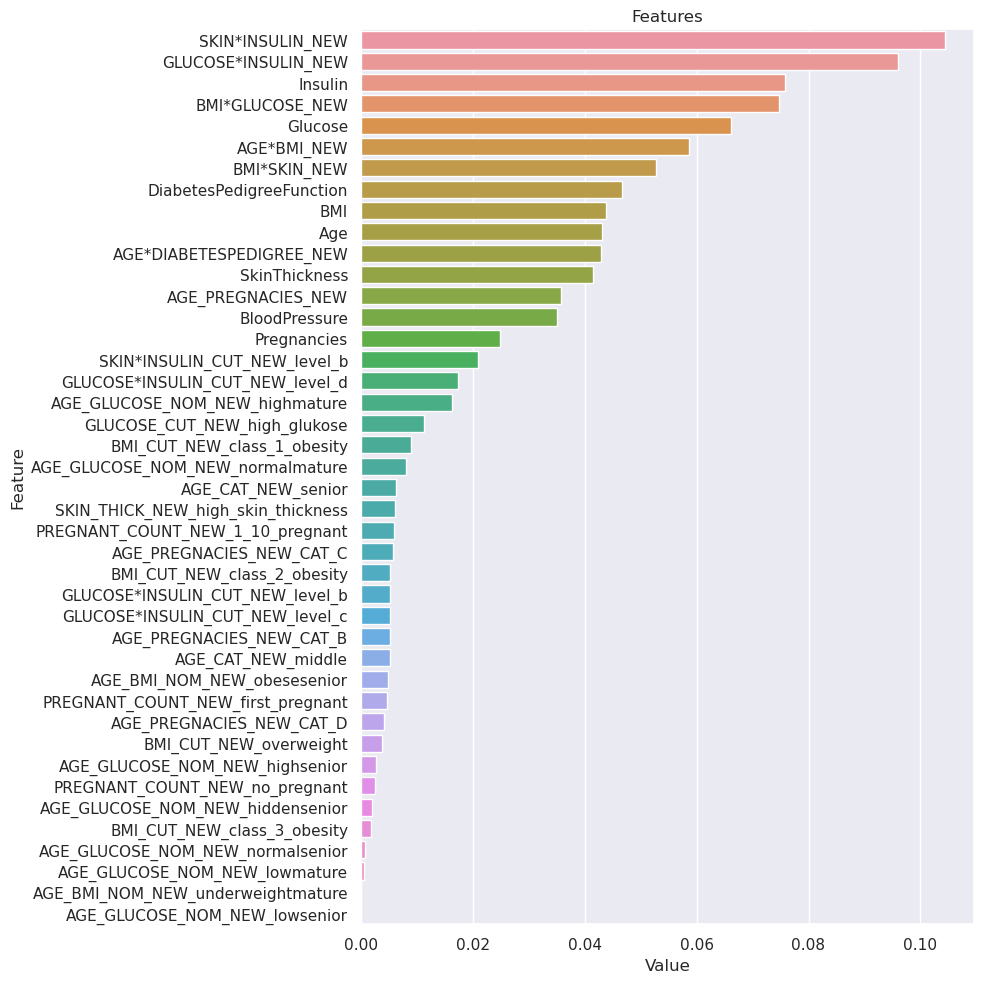

In [51]:
def plot_importance(model, features, num=len(X)):
    feature_imp = pd.DataFrame({'Value': model.feature_importances_, 'Feature': features.columns})
    plt.figure(figsize = (10, 10))
    sns.set(font_scale = 1)
    sns.barplot(x = "Value", y = "Feature", data = feature_imp.sort_values(by = "Value", ascending = False)[0:num])
    plt.title('Features')
    plt.tight_layout()
    plt.show(block=True)

plot_importance(rf_model, X_train)

#We can create a rare variable by combining rare variables that have little effect on the success of the model